<a href="https://colab.research.google.com/github/umiSirya/MachineLearning-1/blob/main/Flight_Ticket_Price.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction**
The flight price dataset used in this study was acquired from Kaggle. This dataset is believed to have been originally collected from the "Ease My Trip" travel website. The primary objective of this study is to conduct a comprehensive analysis of the flight booking data, including the application of various statistical hypothesis tests. This approach will enable the extraction of valuable and statistically significant information from the dataset. Furthermore, this study aims to build a predictive model that can accurately forecast flight prices based on the identified patterns and relationships within the data.

**FEATURES**

The various features of the dataset are explained below:

1) **Airline:** The name of the airline company is stored in the airline column. It is a categorical feature having 6 different airlines.

2) **Flight:** Flight stores information regarding the plane's flight code. It is a categorical feature.

3)**Source City:** City from which the flight takes off. It is a categorical feature having 6 unique cities.

4) **Departure Time:** This is a derived categorical feature obtained created by grouping time periods into bins. It stores information about the departure time and have 6 unique time labels.

5) **Stops:** A categorical feature with 3 distinct values that stores the number of stops between the source and destination cities.

6) **Arrival Time:** This is a derived categorical feature created by grouping time intervals into bins. It has six distinct time labels and keeps information about the arrival time.

7) **Destination City:** City where the flight will land. It is a categorical feature having 6 unique cities.

8) **Class:** A categorical feature that contains information on seat class; it has two distinct values: Business and Economy.

9) **Duration:** A continuous feature that displays the overall amount of time it takes to travel between cities in hours.

10)**Days Left:** This is a derived characteristic that is calculated by subtracting the trip date by the booking date.

11) **Price:** Target variable stores information of the ticket price.


# Python Libraries

In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import Ridge
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')




In [2]:
df = pd.read_csv('/content/Clean_Dataset.csv')

df.head()

,Unnamed: 0,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


# Exploratory Data Analysis

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        300153 non-null  int64  
 1   airline           300153 non-null  object 
 2   flight            300153 non-null  object 
 3   source_city       300153 non-null  object 
 4   departure_time    300153 non-null  object 
 5   stops             300153 non-null  object 
 6   arrival_time      300153 non-null  object 
 7   destination_city  300153 non-null  object 
 8   class             300153 non-null  object 
 9   duration          300153 non-null  float64
 10  days_left         300153 non-null  int64  
 11  price             300153 non-null  int64  
dtypes: float64(1), int64(3), object(8)
memory usage: 27.5+ MB


In [4]:
# Droping the useless column 'Unnamed: 0'
df=df.drop('Unnamed: 0',axis=1)

In [5]:
# distribution graphs of the data


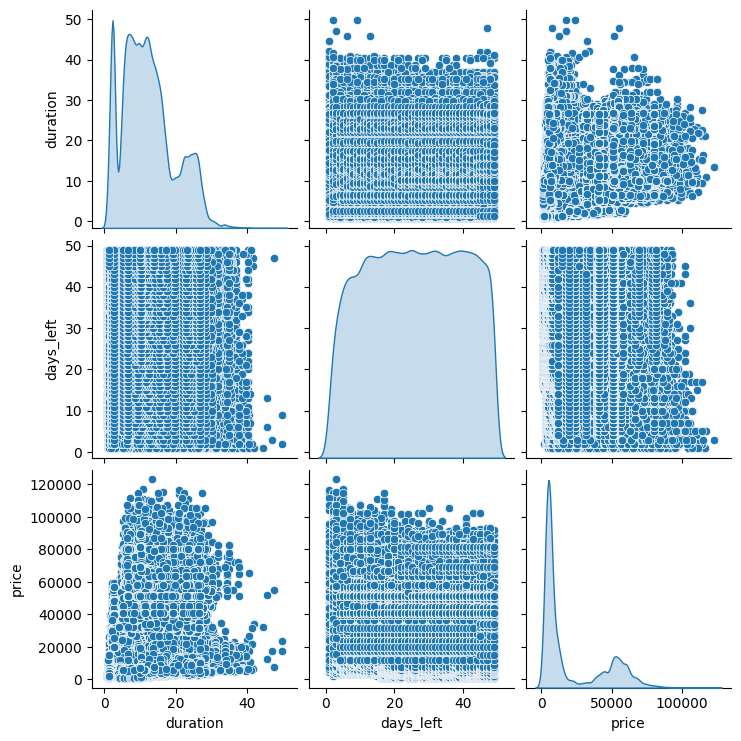

In [6]:
# pair plot of numeric columns
sns.pairplot(df, diag_kind='kde')
plt.show()


# Visualisations

**Research Questions**

The aim of our study is to answer the below research questions:

a) Does price vary with Airlines?

b) How does the ticket price vary between Economy and Business class?

c) How is the price affected when tickets are bought in just 1 or 2 days before departure?



Does price vary with Airlines?

In [7]:
fig = px.box(df, x='airline', y='price',
             title='Airlines Vs Price',
             labels={'airline': 'Airline', 'price': 'Price'})

fig.show()

 How does the ticket price vary between Economy and Business class?

In [8]:
# Pie chart (Top subplot)
fig_pie = go.Figure(go.Pie(labels=df['class'].value_counts().index.tolist(),
                           values=df['class'].value_counts(),
                           hoverinfo='label+percent', textinfo='percent+label',
                           pull=[0, 0, 0, 0, 0, 0.3]))

fig_pie.update_layout(
    title='Flight Class Distribution',
    showlegend=True,
)

# Box plot (Bottom subplot)
fig_box = px.box(df, x='class', y='price', title='Price Distribution by Class')
fig_box.update_yaxes(range=[0, 130000], tick0=0, dtick=10000)

# Show the pie chart and box plot together
fig_pie.show()
fig_box.show()

How is the price affected when tickets are bought in just 1 or 2 days
before departure?

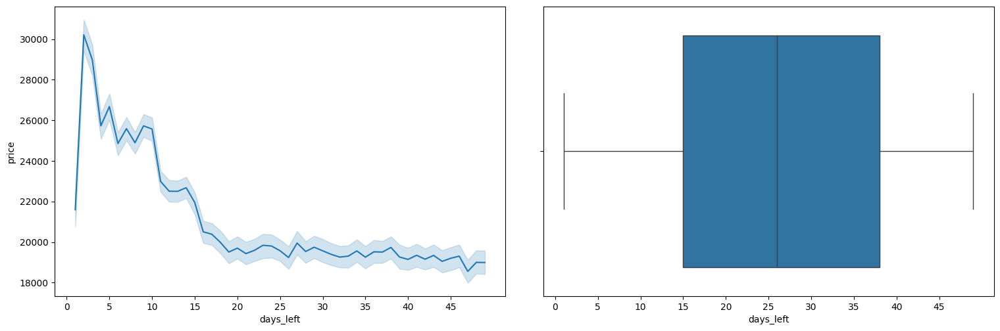

In [9]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.tight_layout()
sns.lineplot(x='days_left', y='price', data=df, ax=ax[0]).set_xticks(np.arange(0, 50, 5))
sns.boxplot(data=df, x='days_left', ax=ax[1]).set_xticks(np.arange(0, 50, 5))
plt.show()




# Pre-processing

In [10]:
# Label encoding categorical columns in my dataset

# 1.Airline Column
df.airline = df.airline.replace(
    {
        'Vistara' : 1,
        'Air_India' : 2,
        'Indigo' : 3,
        'GO_FIRST' : 4,
        'AirAsia': 5,
        'SpiceJet' : 6
    }
)
# 2.source_city column
df.source_city = df.source_city.replace(
    {
        'Delhi' : 1,
        'Mumbai' : 2,
        'Bangalore' : 3,
        'Kolkata' : 4,
        'Hyderabad'  : 5,
        'Chennai' : 6
    }
)

# 3. departure_time column
df.departure_time = df.departure_time.replace(
    {
        'Morning' : 1,
        'Early_Morning' : 2,
        'Evening' : 3,
        'Night' : 4,
        'Afternoon' : 5,
        'Late_Night' : 6
    }
)

# 4. stops column
df.stops = df.stops.replace(
    {
        'one' : 1,
        'zero' : 2,
        'two_or_more' : 3
    }
)

# 5. arrival_time column
df.arrival_time = df.arrival_time.replace(
    {
        'Night' : 1,
        'Evening' : 2,
        'Morning' : 3,
        'Afternoon' : 4,
        'Early_Morning' : 5,
        'Late_Night' : 6
    }
)

# 6. destination_city column
df.destination_city = df.destination_city.replace(
    {
        'Mumbai' : 1,
        'Delhi' : 2,
        'Bangalore' : 3,
        'Kolkata' : 4,
        'Hyderabad' : 5,
        'Chennai' : 6
    }
)

# 7. flight_class
df['class'] = df['class'].replace(
    {
        'Economy' : 1,
        'Business' :2
    }
)

In [11]:
df.describe()


,airline,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
count,300153.000000,300153.000000,300153.000000,300153.000000,300153.000000,300153.000000,300153.000000,300153.000000,300153.000000,300153.000000
mean,2.153072,3.201487,2.794901,1.208480,2.498846,3.268316,1.311464,12.221021,26.004751,20889.660523
std,1.348357,1.684757,1.401659,0.503533,1.407841,1.688644,0.463093,7.191997,13.561004,22697.767366
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.830000,1.000000,1105.000000
25%,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000,1.000000,6.830000,15.000000,4783.000000
50%,2.000000,3.000000,3.000000,1.000000,2.000000,3.000000,1.000000,11.250000,26.000000,7425.000000
75%,3.000000,5.000000,4.000000,1.000000,3.000000,5.000000,2.000000,16.170000,38.000000,42521.000000
max,6.000000,6.000000,6.000000,3.000000,6.000000,6.000000,2.000000,49.830000,49.000000,123071.000000


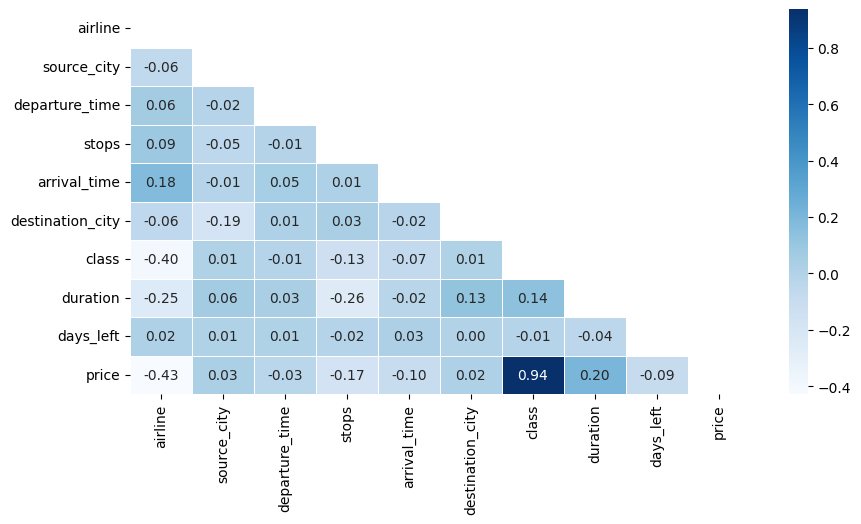

In [12]:
# dropping the flight column
df1= df.drop(columns=['flight'])

# correlation heatmap
corr = df1.corr()
plt.figure(figsize=(10, 5))
sns.heatmap(corr, annot=True, fmt='.2f', linewidths=0.5, linecolor='white', mask=np.triu(corr), cmap='Blues')
plt.show()

# Train and Test set split

In [13]:
# Define X (features) and y (target variable)
X = df1.drop(columns=['price'])
y = df1['price']


In [14]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#split a portion for validation
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [15]:
# Scaling the data
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# Modelling

**Linear Regression**

In [16]:
# Linear Regression Model
model = LinearRegression()

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

# Print evaluation metrics
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)


Mean Squared Error: 53918656.86055972
Root Mean Squared Error: 7342.932442870472
R-squared: 0.8954015305177012


In [17]:
# Define the Ridge regression model
ridge = Ridge()

# Define the hyperparameter grid for tuning
param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100, 1000],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'saga']
}

# Use GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(ridge, param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters and the best model
best_ridge = grid_search.best_estimator_
print(f"Best Hyperparameters: {grid_search.best_params_}")

# Predict on the test data
y_pred = best_ridge.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")

# Cross-validate the final model for better generalization estimates
cross_val_scores = cross_val_score(best_ridge, X_train_scaled, y_train, cv=5, scoring='r2')
print(f"Cross-validated R-squared: {cross_val_scores.mean():.4f} ± {cross_val_scores.std():.4f}")

Best Hyperparameters: {'alpha': 1, 'solver': 'saga'}
Mean Squared Error: 53918621.81535684
Root Mean Squared Error: 7342.930056548056
R-squared: 0.8954015985029737
Cross-validated R-squared: 0.8949 ± 0.0011


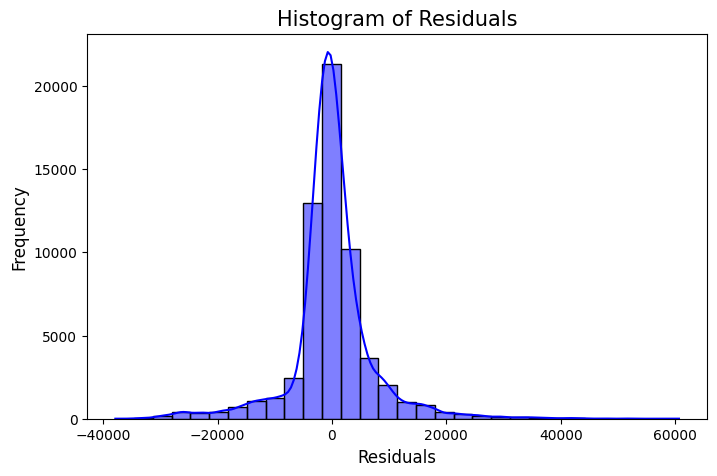

In [18]:
# Residual Analysis for Linear Regression Model

# Calculate residuals
residuals = y_test - y_pred

plt.figure(figsize=(8, 5))
sns.histplot(residuals, kde=True, bins=30, color='blue')
plt.title("Histogram of Residuals", fontsize=15)
plt.xlabel("Residuals", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.show()

The residuals' distribution looks reasonably normal, which suggests that the model fits the data well.

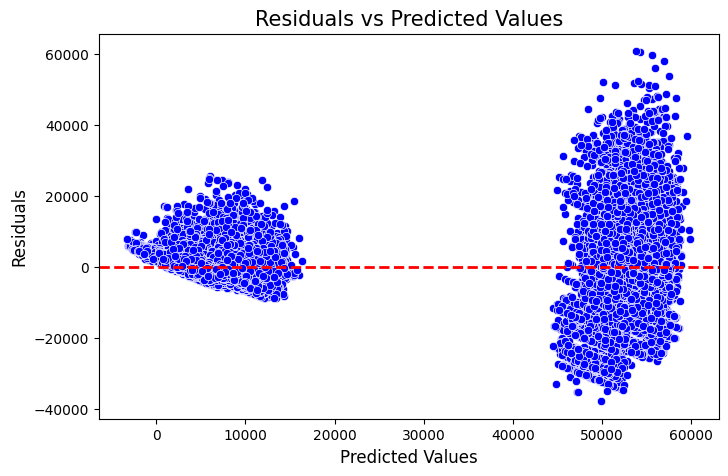

In [19]:
# Residuals vs Predicted values
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_pred, y=residuals, color='blue')
plt.axhline(0, color='red', linestyle='--', linewidth=2)
plt.title("Residuals vs Predicted Values", fontsize=15)
plt.xlabel("Predicted Values", fontsize=12)
plt.ylabel("Residuals", fontsize=12)
plt.show()



This residuals vs. predicted values plot shows potential issues with the regression model, including heteroscedasticity (varying spread of residuals) and distinct clusters of data points. The residuals are not evenly distributed around zero, indicating that the model may need improvements.

**Random Forest**

In [20]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

# Evaluate the model performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print("Mean Squared Error:", mse)
print("R-squared:", r2)



Mean Squared Error: 8117433.949097286
R-squared: 0.9842527389101136


In [21]:
# Feature Importance
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importance_df)

Feature Importances:
            Feature  Importance
6             class    0.879412
7          duration    0.059735
8         days_left    0.018481
0           airline    0.011194
5  destination_city    0.010820
1       source_city    0.009346
4      arrival_time    0.005137
2    departure_time    0.004073
3             stops    0.001802


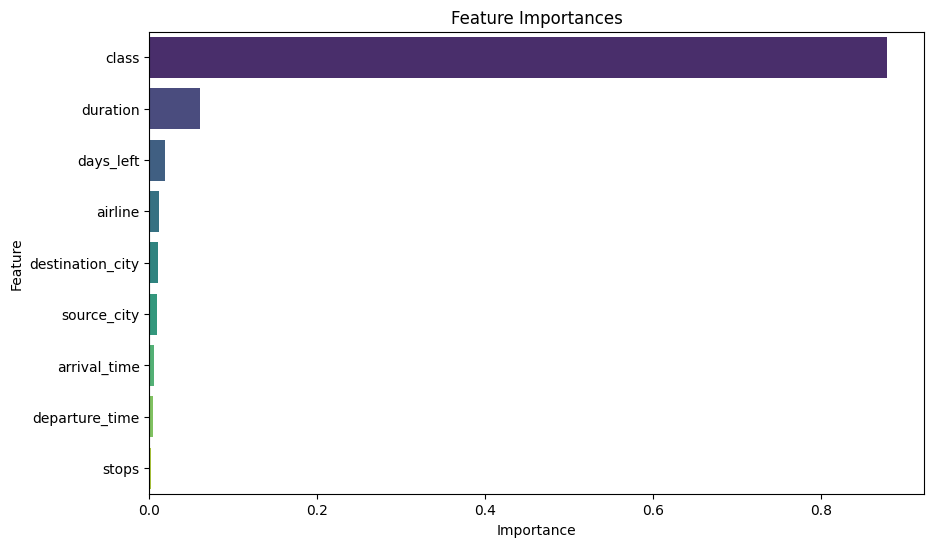

In [22]:
# horizontal bar gragh of the feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


**Decision Trees**

In [23]:
dt_regressor = DecisionTreeRegressor(random_state=42)

# Fit the model
dt_regressor.fit(X_train, y_train)

# Make predictions
y_pred = dt_regressor.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 13177057.204324525
R-squared: 0.9744374193256057



# Hyperparameter Tuning for Decision Trees

# **Neural Networks**

In [30]:
# buidling the neural networks
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow import keras

model = keras.Sequential([
    keras.layers.Dense(128, activation='relu', input_shape=[X_train.shape[1]]),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(16, activation='relu'),
    keras.layers.Dense(1)
])

# compiling my model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])


In [31]:
# train my model using training data
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
6004/6004 ━━━━━━━━━━━━━━━━━━━━ 16s 2ms/step - loss: 277552640.0000 - mse: 277552640.0000 - val_loss: 37796096.0000 - val_mse: 37796096.0000
Epoch 2/50
6004/6004 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step - loss: 35799412.0000 - mse: 35799412.0000 - val_loss: 32363792.0000 - val_mse: 32363792.0000
Epoch 3/50
6004/6004 ━━━━━━━━━━━━━━━━━━━━ 20s 2ms/step - loss: 31841696.0000 - mse: 31841696.0000 - val_loss: 30022692.0000 - val_mse: 30022692.0000
Epoch 4/50
6004/6004 ━━━━━━━━━━━━━━━━━━━━ 22s 2ms/step - loss: 30555818.0000 - mse: 30555818.0000 - val_loss: 29608102.0000 - val_mse: 29608102.0000
Epoch 5/50
6004/6004 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step - loss: 29417458.0000 - mse: 29417458.0000 - val_loss: 29623954.0000 - val_mse: 29623954.0000
Epoch 6/50
6004/6004 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step - loss: 28925210.0000 - mse: 28925210.0000 - val_loss: 32627722.0000 - val_mse: 32627722.0000
Epoch 7/50
6004/6004 ━━━━━━━━━━━━━━━━━━━━ 21s 2ms/step - loss: 28490816.0000 - mse: 28490816.0000 - val_

In [26]:
# test loss
test_loss = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}")



1876/1876 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 20828524.0000 - mae: 2597.7681
Test Loss: [20505418.0, 2585.6220703125]


In [27]:
#predicting the Flight ticket prices
y_pred = model.predict(X_test)
print('Predicted prices:', y_pred[:5])


1876/1876 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
Predicted prices: [[ 5015.921]
 [66196.2  ]
 [ 8720.587]
 [56202.453]
 [ 6151.439]]


In [29]:

# evaluation using MSE and RMSE
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")



Mean Squared Error: 20505424.0
Root Mean Squared Error: 4528.291510051004
